In [1]:
from skimage.filters import threshold_otsu, gaussian
from skimage.restoration import denoise_nl_means, estimate_sigma
from PIL import Image, ImageStat
import matplotlib.pyplot as plt
import cv2
import numpy as np
from scipy import ndimage
import os
from skimage import img_as_ubyte, img_as_float
from skimage.segmentation import morphological_chan_vese, checkerboard_level_set, clear_border
from skimage import measure
from skimage.color import label2rgb
from carbon_detection.carbon_model import get_preds as carbon_predict
from oil_detection.oil_model import get_preds as oil_predict

In [2]:
def carbon_simplify(img):   
    simplified = np.array([[np.clip((((pxl*3)//80)+1)*60,0,255)  if pxl != 0 else 0 
                            for pxl in row] for row in img])
    return simplified

In [3]:
def oil_simplify(img):
    simplified = np.array([[(pxl//80)*80 for pxl in row] for row in img])
    return simplified

In [4]:
def get_masks(img):
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    pil_img = Image.fromarray(img_hsv)
    mean_hue, mean_sat, mean_val = ImageStat.Stat(pil_img).mean
    img_gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    dark = (0,0,5)
    light = (20,255,200)
    mask_orange = cv2.inRange(img_hsv, dark, light)
    img_orange = cv2.bitwise_and(img_gray, img_gray, mask=mask_orange)
    
    dark = (120,0,5)
    light = (180,255,60)
    mask_red = cv2.inRange(img_hsv, dark, light)
    img_red = cv2.bitwise_and(img_gray, img_gray, mask=mask_red)
    
    img_carbon = cv2.bitwise_or(img_orange, img_red)
    img_carbon = ndimage.median_filter(input=img_carbon, size=20, cval=0.0, mode='reflect') 
    
    dark = (0,0,50+mean_val/3)
    light = (179,255,255)
    mask_yel = cv2.inRange(img_hsv, dark, light)
    img_yel = cv2.bitwise_and(img_gray, img_gray, mask=mask_yel)
    img_yel = ndimage.median_filter(input=img_yel, size=20, cval=0.0, mode='reflect') 
    
    return img_carbon, img_yel

In [5]:
def contour(img):
    init_ls = checkerboard_level_set(img.shape, 6)
    ls = morphological_chan_vese(img, 35, init_level_set=init_ls, smoothing=3)
    return ls

In [6]:
def crop(image):
    w, h = image.size
    i = 5
    max_reas = 0
    pos = 0
    while i <= w/4:
        area = [i, 0, i+1, h]
        leftcrop = image.crop(area)
        area = [i+1, 0, i+2, h]
        rightcrop = image.crop(area)
        lr, lg, lb = ImageStat.Stat(leftcrop).mean
        rr, rg, rb = ImageStat.Stat(rightcrop).mean
        reas = abs(rr-lr + rg-lg + rb-lb)
        if reas > 3:
            max_reas = reas
            pos = i
        i += 1

    i = w-5
    max_reas = 0
    pos2 = w
    while i >= w*3/4:
        area = [i, 0, i+1, h]
        leftcrop = image.crop(area)
        area = [i, 0, i+2, h]
        rightcrop = image.crop(area)
        lr, lg, lb = ImageStat.Stat(leftcrop).mean
        rr, rg, rb = ImageStat.Stat(rightcrop).mean
        reas = abs(rr-lr + rg-lg + rb-lb)
        if reas > 3:
            max_reas = reas
            pos2 = i
        i -= 1
    
    croparea = [pos, 0, pos2, h]
    
    return croparea

In [7]:
image = Image.open('data/Unload2/data/1001885.jpeg')
dl_img = Image.open('data/Unload2/data/1001884.jpeg')
croparea = crop(dl_img)
cropped_img = np.array(image.crop(croparea))

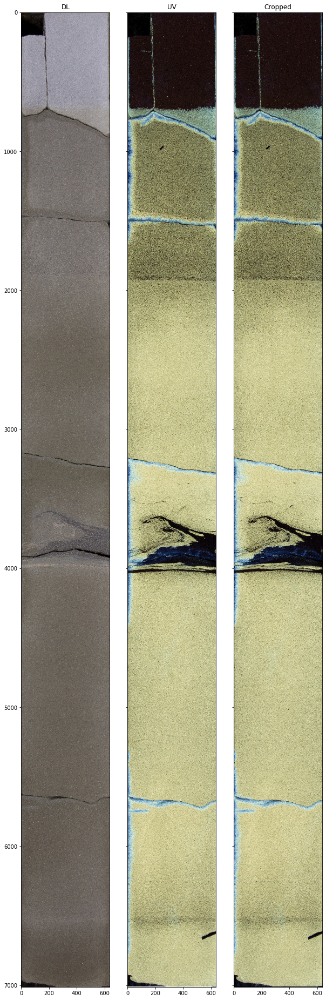

In [8]:
fig, (ax1,ax2,ax3) = plt.subplots(1, 3,  figsize=(10,100), sharex=True, sharey=True)

ax1.imshow(dl_img)
ax1.set_title('DL')
ax2.imshow(image)
ax2.set_title('UV')
ax3.imshow(cropped_img)
ax3.set_title('Cropped')

plt.show()

In [9]:
carbon_mask, oil_mask = get_masks(cropped_img)

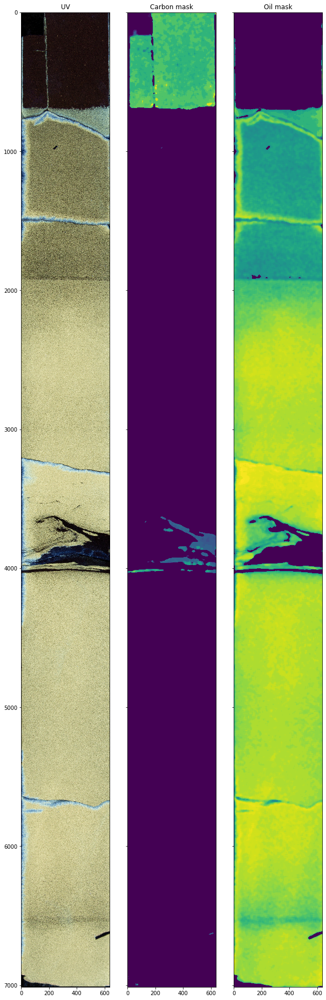

In [10]:
fig, (ax1,ax2,ax3) = plt.subplots(1, 3,  figsize=(10,100), sharex=True, sharey=True)

ax1.imshow(cropped_img)
ax1.set_title('UV')
ax2.imshow(carbon_mask)
ax2.set_title('Carbon mask')
ax3.imshow(oil_mask)
ax3.set_title('Oil mask')

plt.show()

In [11]:
carbon_mask = carbon_simplify(carbon_mask)
oil_mask = oil_simplify(oil_mask)

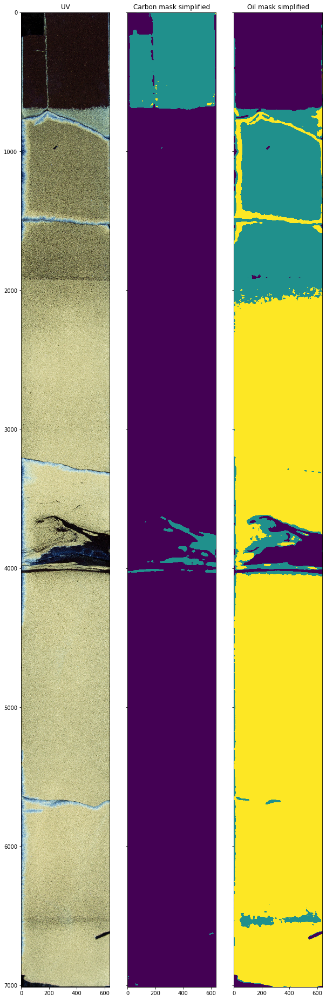

In [12]:
fig, (ax1,ax2,ax3) = plt.subplots(1, 3,  figsize=(10,100), sharex=True, sharey=True)

ax1.imshow(cropped_img)
ax1.set_title('UV')
ax2.imshow(carbon_mask)
ax2.set_title('Carbon mask simplified')
ax3.imshow(oil_mask)
ax3.set_title('Oil mask simplified')

plt.show()

In [13]:
ls_carbon = contour(carbon_mask)
ls_yel = contour(oil_mask)

In [14]:
mask = np.array([[[carbon_mask[i][j], oil_mask[i][j], 0] 
        for j in range(len(cropped_img[0]))] for i in range(len(cropped_img))])

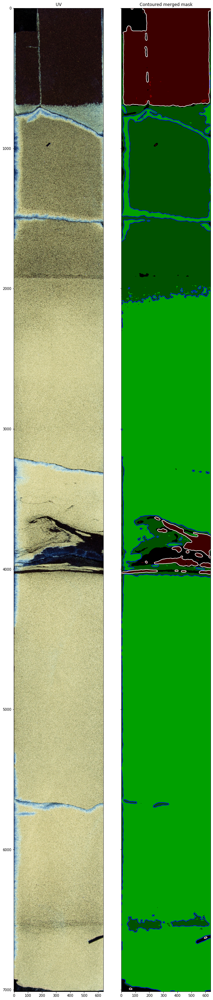

In [15]:
fig, (ax1,ax2) = plt.subplots(1, 2,  figsize=(10,100), sharex=True, sharey=True)

ax1.imshow(cropped_img)
ax1.set_title('UV')
ax2.imshow(mask)
ax2.contour(ls_carbon, [0.5], colors='white')
ax2.contour(ls_yel, [0.5], colors='blue')
ax2.set_title('Contoured merged mask')

plt.show()

In [16]:
carbon_label = measure.label(carbon_mask, neighbors=8)
carbon_overlay = label2rgb(carbon_label, image=cropped_img)
oil_label = measure.label(oil_mask, neighbors=8)
oil_overlay = label2rgb(oil_label, image=cropped_img)

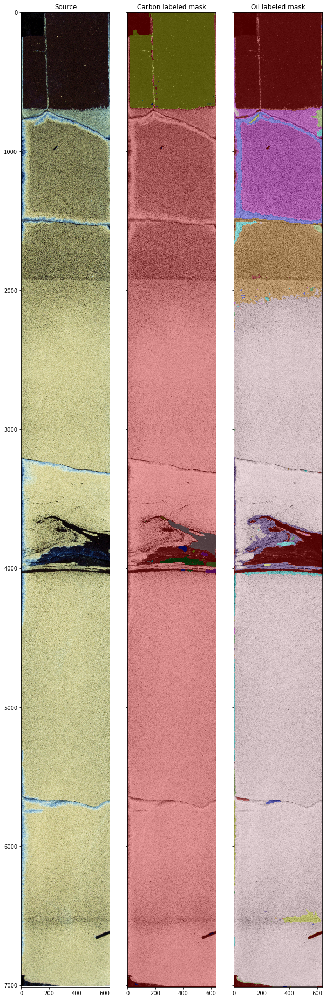

In [17]:
fig, (ax1,ax2, ax3) = plt.subplots(1, 3,  figsize=(10,100), sharex=True, sharey=True)

ax1.imshow(image)
ax1.set_title('Source')
ax2.imshow(carbon_overlay)
ax2.set_title('Carbon labeled mask')
ax3.imshow(oil_overlay)
ax3.set_title('Oil labeled mask')

plt.show()

In [18]:
print(len(measure.regionprops(carbon_label)))
print(len(measure.regionprops(oil_label)))

51
283


In [19]:
def merge_props(labeled, minsize):
    def dist(a, b):
        dist = ((b[0]-a[0])**2 + (b[1]-a[1])**2)**(0.5)
        return dist
    changed = [0]
    while changed != []:
        changed = []
        props = measure.regionprops(labeled)
        for prop1 in props:
            lbl1 = prop1.label
            if lbl1 not in changed:
                if prop1.area < minsize:
                    merged = False
                    centr1 = prop1.centroid
                    for prop2 in props:
                        centr2 = prop2.centroid
                        lbl2 = prop2.label
                        if lbl1 != lbl2 and lbl2 not in changed and dist(centr1, centr2) < 100:
                            merged = True
                            labeled = np.where(labeled == lbl1, lbl2, labeled)
                            break
                    if merged == False:
                        labeled = np.where(labeled == lbl1, 0, labeled)
                    changed.append(lbl1)
    
    return labeled

In [20]:
minsize = (len(cropped_img[0]) * 100) // 3
carbon_label = merge_props(carbon_label, minsize)
carbon_overlay = label2rgb(carbon_label, image=cropped_img)
oil_label = merge_props(oil_label, minsize)
oil_overlay = label2rgb(oil_label, image=cropped_img)

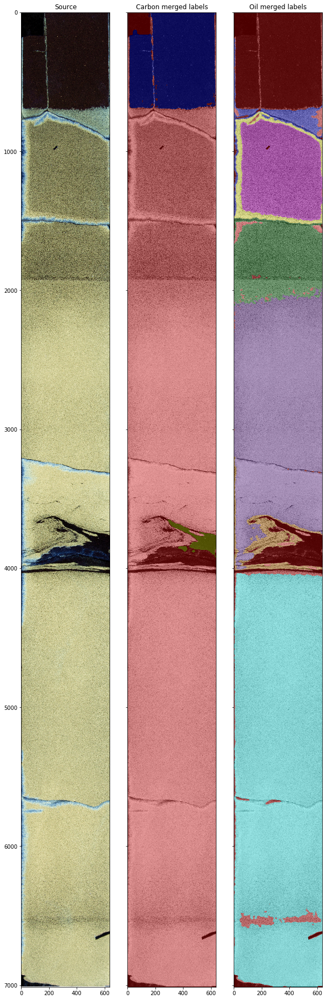

In [21]:
fig, (ax1,ax2, ax3) = plt.subplots(1, 3,  figsize=(10,100), sharex=True, sharey=True)

ax1.imshow(image)
ax1.set_title('Source')
ax2.imshow(carbon_overlay)
ax2.set_title('Carbon merged labels')
ax3.imshow(oil_overlay)
ax3.set_title('Oil merged labels')

plt.show()

In [22]:
def validate_label(img, labeled, predict):
    img = Image.fromarray(img)
    props = measure.regionprops(labeled)
    crops = []
    w, h = img.size
    for prop in props:
        centr = prop.centroid
        croparea = [0, centr[0]-50 if centr[0] > 50 else 0, 
                    w, centr[0]+50 if centr[0]+50 < h else h]
        crop = img.crop(croparea)
        fig, ax = plt.subplots(figsize=(3,50))
        ax.imshow(crop)
        plt.show()
        crops.append(crop)
    preds = predict(crops)
    print(preds)
    for i in range(len(props)):
        lbl = props[i].label
        if preds[i] == 'no':
            labeled = np.array([[0 if c == lbl else c
                                    for c in r] for r in labeled])
        if preds[i] == 'low':
            labeled = np.array([[-1 if c == lbl else c
                                    for c in r] for r in labeled])
        if preds[i] == 'high':
            labeled = np.array([[-2 if c == lbl else c
                                    for c in r] for r in labeled])
    return labeled

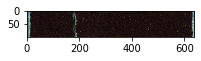

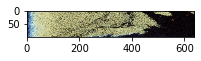

['low' 'no']


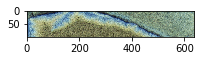

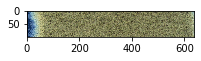

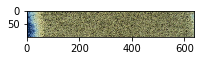

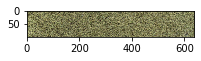

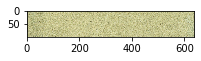

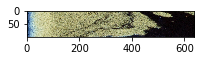

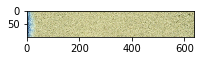

['low' 'low' 'low' 'low' 'high' 'low' 'low']


In [23]:
carbon_label_val = validate_label(cropped_img, carbon_label, carbon_predict)
oil_label_val = validate_label(cropped_img, oil_label, oil_predict)

In [24]:
mask_val = np.array([[[carbon_label_val[i][j]*(-100), oil_label_val[i][j]*(-100), 0] 
                            for j in range(len(cropped_img[0]))] for i in range(len(cropped_img))])

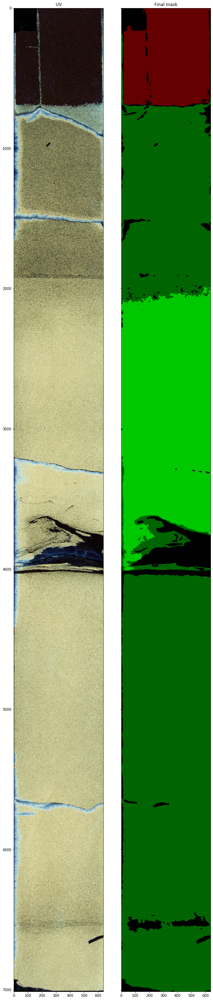

In [25]:
fig, (ax1,ax2) = plt.subplots(1, 2,  figsize=(10,100), sharex=True, sharey=True)

ax1.imshow(cropped_img)
ax1.set_title('UV')
ax2.imshow(mask_val)
ax2.set_title('Final mask')

plt.show()